In [ ]:
%matplotlib inline

# install pillow
!pip install Pillow -U

# download and unzip dataset o train
!wget http://images.cocodataset.org/zips/val2014.zip
!mkdir train
%cd /content/train
!unzip -qq /content/val2014.zip
%cd ..

#download model
!wget https://web.eecs.umich.edu/~justincj/models/vgg16-00b39a1b.pth

# Style Transfer Training

## Import Library

In [1]:
import torch
import torch.nn as nn
import PIL
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
%matplotlib inline

# get utils functions
from utils import grammatrix, loss_of_style, loss_of_content, content_transform, detransform_content, rescale

from PIL import Image
import cv2
import torch.optim as optim
from torchvision import datasets, transforms, models
import random
import numpy as np
import time
import vgg16_fe as vgg # this is used to extract features
import custom_model
import utils


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

## Get data from images

In [63]:
# The content is the image of the user. The style is the image of the style.
# content image is stored in images/omkar.jpeg and style image is stored in images/generosity.jpeg
content_image = PIL.Image.open("images/omkar.jpg").convert('RGB')
style_image = PIL.Image.open("images/van_gogh.jpeg").convert('RGB')
style_name = 'van_gogh' # 'generosity' # 

## Get pretrained models of vgg16 and resnet18

In [3]:
# Load VGG16 model
# The VGG16 model is a pretrained CNN model that was trained on the ImageNet dataset.
vgg16 = torchvision.models.vgg16(pretrained=True).features

# Load ResNet18 model
resnet18 = torchvision.models.resnet18(pretrained=True)


In [4]:
vgg16[21]

Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

In [5]:
resnet18.layer2[1]

BasicBlock(
  (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)

In [6]:
vgg16

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


## train function for style transfer

In [80]:
# defining get_features function 
def get_features(image, model, model_name):
    '''
    Getting feature map from each layer of the model
    '''
    features = list()
    first_feature = image
    if model_name == 'vgg16':
        model = model.features
    # we add image as the input to the model
    for idx, layer in enumerate(model._modules.values()):
        image = layer(first_feature)
        features.append(image)
        first_feature = image
    return features 

In [100]:
def train_st(style, style_layer, style_weight, content, content_layer, content_weight, style_size, image_size, device, model, style_image_name, num_epochs):
    '''
    Train Style Transfer, based on Gatys' paper.
    :Input:
    - style: PyTorch tensor, style image
    - style_layer: int, index of style layer
    - style_weight: float, weight of style layer
    - content: PyTorch tensor, content image
    - content_layer: int, index of content layer
    - content_weight: float, weight of content layer
    - style_size: int, size of style image
    - image_size: int, size of image
    - device: PyTorch device
    - model: 'vgg16' or 'resnet18'
    - style_image_name: string, name of style image
    - num_epochs
    
    :Output:
    - image: PyTorch tensor, image
    '''
    # model 
    if model == 'vgg16':
        model_1 = torchvision.models.vgg16(pretrained=True).to(device)
        # model_1 doesn't require gradients
        for param in model_1.parameters():
            param.requires_grad = False
        
        # model_2 = torchvision.models.vgg16(pretrained=True).to(device)

        # # model_2 doesn't require gradients
        # for param in model_2.parameters():
        #     param.requires_grad = False
    elif model == 'resnet18':
        model_1 = torchvision.models.resnet18(pretrained=True).to(device)
        # model_1 doesn't require gradients
        for param in model_1.parameters():
            param.requires_grad = False

        # model_2 = torchvision.models.resnet18(pretrained=True).to(device)

        # # model_2 doesn't require gradients
        # for param in model_2.parameters():
        #     param.requires_grad = False

    # get style transform
    style = content_transform(style, style_size)
    # convert type of style to float
    style = style.type(torch.cuda.FloatTensor).to(device)

    # get content transform
    content = content_transform(content, image_size)
    # convert type to float
    content = content.type(torch.cuda.FloatTensor).to(device)

    # get style and content features
    content_features = get_features(content, model_1, model)
    style_features = get_features(style, model_1, model)

    # the layer on which we want the content to be 
    content_layer_output = content_features[content_layer]
    # the layers on which we want the style to be
    style_layers_output = [grammatrix(style_features[layer], True) for layer in style_layer]

    # First, initialize the image on which we want to perform style transfer with type torch.FloatTensor
    image = content.clone().type(torch.cuda.FloatTensor).requires_grad_(True).to(device)
    
    # Hyperparameters
    num_epochs = num_epochs
    learning_rate = 10
    decayed_learning_rate = 10

    # define the optimizer as Adam
    optimizer = torch.optim.Adam([image], lr=learning_rate)
    # optimizer = optim.LBFGS([opt_img])
    mse_loss = torch.nn.MSELoss().to(device)

    best_loss = float('inf')

    for epoch in range(num_epochs):
        image.data.clamp_(-1.5, 1.5)
        # model train
        model_1.train()
        optimizer.zero_grad()

        # get the features of the image
        image_features = get_features(image, model_1, model)

        # get the content loss
        # content_loss = content_weight * torch.sum((image_features[content_layer] - content_layer_output)**2)
        content_loss = content_weight * mse_loss(image_features[content_layer], content_layer_output)
        # get the style loss
        style_loss = 0
        for i in range(len(style_layer)):
            style_layer_index = style_layer[i]
            layer_output = image_features[style_layer_index]
            weight = style_weight[i]
            image_grame = grammatrix(layer_output, True)
            style_gram = style_layers_output[i]
            style_loss += weight * torch.sum((image_grame - style_gram)**2)
        
        # style_loss *= style_weight
        # get athe total loss
        total_loss = content_loss + style_loss

        # perform backpropagation
        total_loss.backward(retain_graph=True)

        # if epoch == 150 or epoch == 300:
        #     learning_rate = learning_rate/decayed_learning_rate
        #     optimizer = torch.optim.Adam([image], lr=learning_rate)

        # update the image
        optimizer.step()

        

        if epoch % 10 == 0:
            print("Epoch {}:".format(epoch))
            print("Content Loss: {:.4f}".format(content_loss.item()))
            print("Style Loss: {:.4f}".format(style_loss.item()))
            print("Total Loss: {:.4f}".format(total_loss.item()))
            print()

            # display the image
            plt.axis("off")
            plt.imshow(detransform_content(image.data.cpu(), image_size))
            plt.show()

            # save the checkpoint
            # if checkpoints folder doesn't exist, create it
            if not os.path.exists("checkpoints"):
                os.mkdir("checkpoints")
            # save the checkpoint of the model
            if total_loss.item() < best_loss:
                model_1.eval()
                best_loss = total_loss.item()
                # torch.save(model_1.state_dict(), "checkpoints/{}_model_{}.pth".format(style_image_name, epoch))
                # save the image in pth format
                # torch.save(image.data, "checkpoints/{}_image_{}.pth".format(style_image_name, epoch))
                print("Saved checkpoint of model and image")
        
        if best_loss > total_loss.item():
            # save the best model and image
            model_1.eval()
            best_loss = total_loss.item()
            # torch.save(model_1.state_dict(), "checkpoints/{}_model_best.pth".format(style_image_name))
            # torch.save(image.data, "checkpoints/{}_image_best.pth".format(style_image_name))

## Training

In [103]:
# parameters for train_st for vgg

parameters = dict(
    style = style_image,
    # get any layers of vgg model
    style_layer = (2, 5, 10, 17, 19),
    style_weight = [1e7/n**2 for n in (64, 128, 256, 512, 512)],
    content = content_image,
    content_layer = 2,
    content_weight = 1e2,
    style_size = 192,
    image_size = 512,
    device = device,
    model = 'vgg16',
    style_image_name = style_name,
    num_epochs = 1000
)


Epoch 0:
Content Loss: 3.9680
Style Loss: 9556.6660
Total Loss: 9560.6338



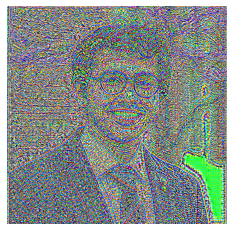

Saved checkpoint of model and image
Epoch 10:
Content Loss: 1190.6864
Style Loss: 58741.2070
Total Loss: 59931.8945



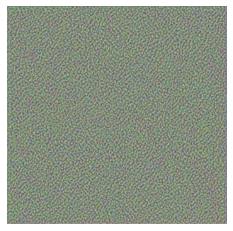

Epoch 20:
Content Loss: 731.9459
Style Loss: 14658.9277
Total Loss: 15390.8740



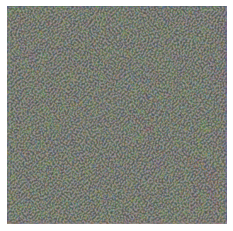

Epoch 30:
Content Loss: 502.2384
Style Loss: 4519.9214
Total Loss: 5022.1597



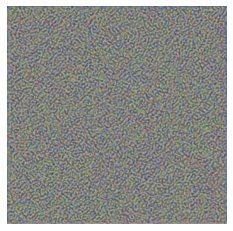

Saved checkpoint of model and image
Epoch 40:
Content Loss: 385.5312
Style Loss: 1508.6105
Total Loss: 1894.1416



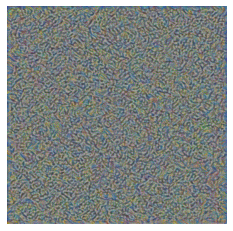

Saved checkpoint of model and image
Epoch 50:
Content Loss: 333.2403
Style Loss: 658.2805
Total Loss: 991.5208



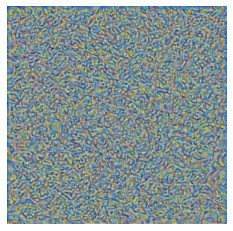

Saved checkpoint of model and image
Epoch 60:
Content Loss: 317.3618
Style Loss: 353.6975
Total Loss: 671.0593



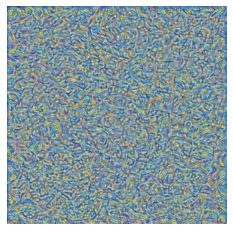

Saved checkpoint of model and image
Epoch 70:
Content Loss: 312.0256
Style Loss: 218.9184
Total Loss: 530.9440



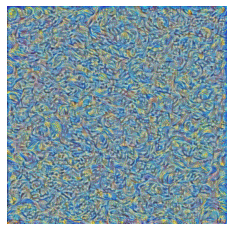

Saved checkpoint of model and image
Epoch 80:
Content Loss: 307.9395
Style Loss: 156.4275
Total Loss: 464.3670



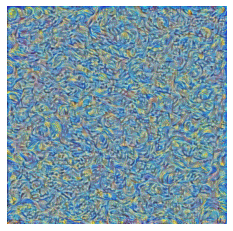

Saved checkpoint of model and image
Epoch 90:
Content Loss: 304.1055
Style Loss: 124.5983
Total Loss: 428.7038



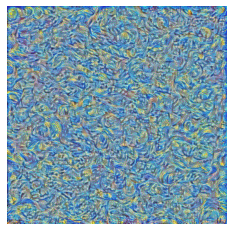

Saved checkpoint of model and image
Epoch 100:
Content Loss: 300.1797
Style Loss: 106.2796
Total Loss: 406.4593



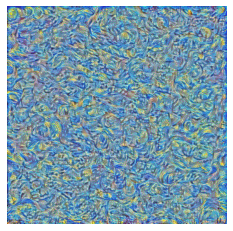

Saved checkpoint of model and image
Epoch 110:
Content Loss: 296.3864
Style Loss: 94.4232
Total Loss: 390.8096



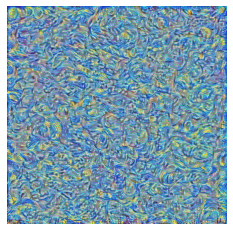

Saved checkpoint of model and image
Epoch 120:
Content Loss: 292.7546
Style Loss: 85.9522
Total Loss: 378.7068



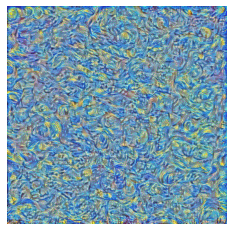

Saved checkpoint of model and image
Epoch 130:
Content Loss: 289.2383
Style Loss: 79.5565
Total Loss: 368.7949



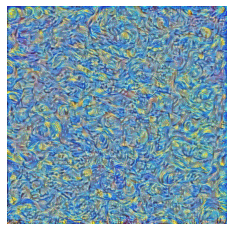

Saved checkpoint of model and image
Epoch 140:
Content Loss: 285.8931
Style Loss: 74.4376
Total Loss: 360.3307



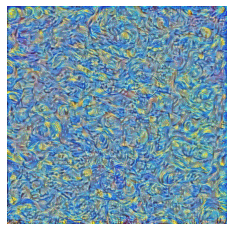

Saved checkpoint of model and image
Epoch 150:
Content Loss: 282.6695
Style Loss: 70.2139
Total Loss: 352.8834



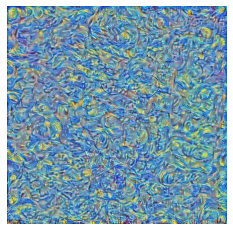

Saved checkpoint of model and image
Epoch 160:
Content Loss: 279.5619
Style Loss: 66.6271
Total Loss: 346.1891



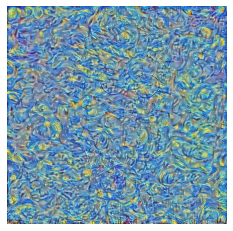

Saved checkpoint of model and image
Epoch 170:
Content Loss: 276.5776
Style Loss: 63.5109
Total Loss: 340.0884



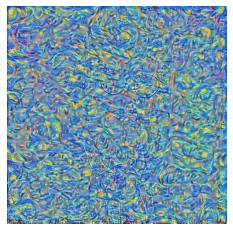

Saved checkpoint of model and image
Epoch 180:
Content Loss: 273.7055
Style Loss: 60.7721
Total Loss: 334.4776



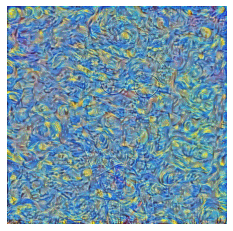

Saved checkpoint of model and image
Epoch 190:
Content Loss: 270.9389
Style Loss: 58.3243
Total Loss: 329.2632



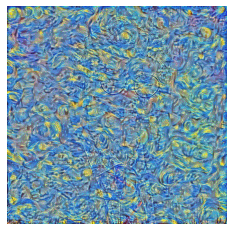

Saved checkpoint of model and image
Epoch 200:
Content Loss: 268.2820
Style Loss: 56.1114
Total Loss: 324.3934



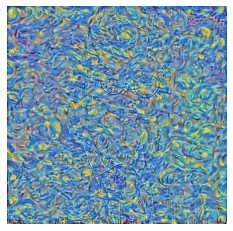

Saved checkpoint of model and image
Epoch 210:
Content Loss: 265.7205
Style Loss: 54.1078
Total Loss: 319.8283



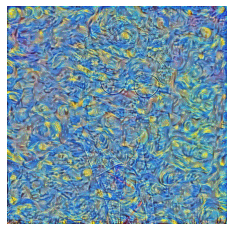

Saved checkpoint of model and image
Epoch 220:
Content Loss: 263.2710
Style Loss: 52.2730
Total Loss: 315.5440



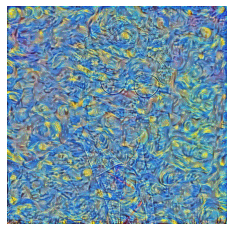

Saved checkpoint of model and image
Epoch 230:
Content Loss: 260.9070
Style Loss: 50.5970
Total Loss: 311.5040



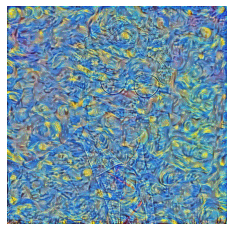

Saved checkpoint of model and image
Epoch 240:
Content Loss: 258.6366
Style Loss: 49.0609
Total Loss: 307.6975



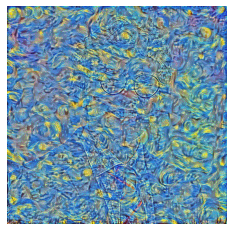

Saved checkpoint of model and image
Epoch 250:
Content Loss: 256.4606
Style Loss: 47.6368
Total Loss: 304.0974



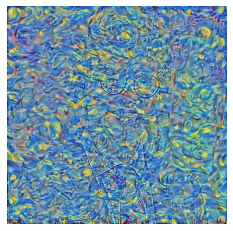

Saved checkpoint of model and image
Epoch 260:
Content Loss: 254.3499
Style Loss: 46.3305
Total Loss: 300.6803



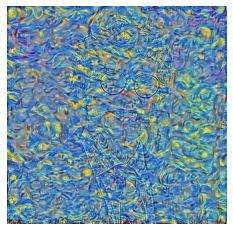

Saved checkpoint of model and image
Epoch 270:
Content Loss: 252.3195
Style Loss: 45.1135
Total Loss: 297.4329



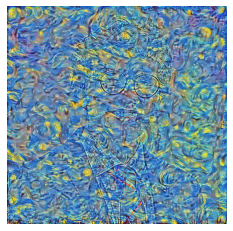

Saved checkpoint of model and image
Epoch 280:
Content Loss: 250.3741
Style Loss: 43.9749
Total Loss: 294.3490



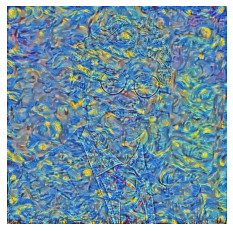

Saved checkpoint of model and image
Epoch 290:
Content Loss: 248.5189
Style Loss: 42.9025
Total Loss: 291.4214



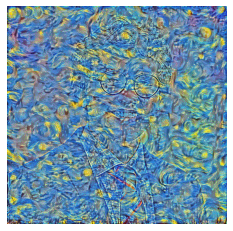

Saved checkpoint of model and image
Epoch 300:
Content Loss: 246.7252
Style Loss: 41.8939
Total Loss: 288.6191



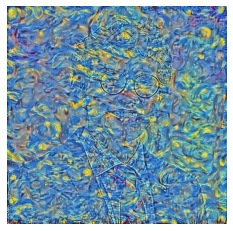

Saved checkpoint of model and image
Epoch 310:
Content Loss: 244.9880
Style Loss: 40.9499
Total Loss: 285.9379



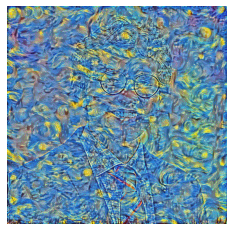

Saved checkpoint of model and image
Epoch 320:
Content Loss: 243.3173
Style Loss: 40.0653
Total Loss: 283.3826



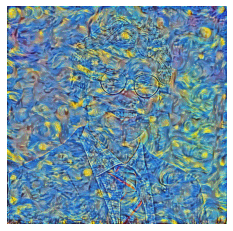

Saved checkpoint of model and image
Epoch 330:
Content Loss: 241.7164
Style Loss: 39.2320
Total Loss: 280.9484



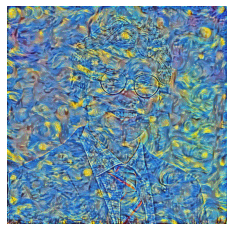

Saved checkpoint of model and image
Epoch 340:
Content Loss: 240.1862
Style Loss: 38.4394
Total Loss: 278.6256



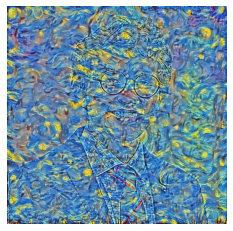

Saved checkpoint of model and image
Epoch 350:
Content Loss: 238.7171
Style Loss: 37.6914
Total Loss: 276.4084



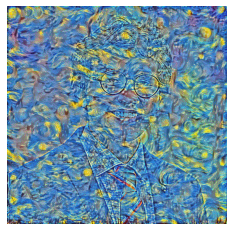

Saved checkpoint of model and image
Epoch 360:
Content Loss: 237.2964
Style Loss: 36.9923
Total Loss: 274.2888



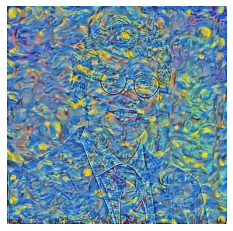

Saved checkpoint of model and image
Epoch 370:
Content Loss: 235.9282
Style Loss: 36.3349
Total Loss: 272.2631



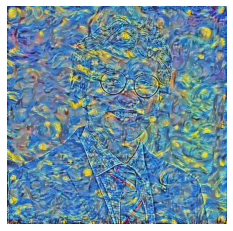

Saved checkpoint of model and image
Epoch 380:
Content Loss: 234.6124
Style Loss: 35.7075
Total Loss: 270.3198



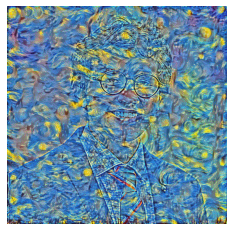

Saved checkpoint of model and image
Epoch 390:
Content Loss: 233.3496
Style Loss: 35.1051
Total Loss: 268.4547



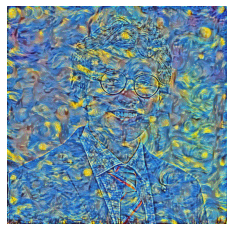

Saved checkpoint of model and image
Epoch 400:
Content Loss: 232.1265
Style Loss: 34.5417
Total Loss: 266.6682



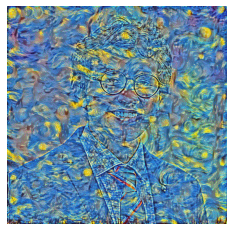

Saved checkpoint of model and image
Epoch 410:
Content Loss: 230.9488
Style Loss: 34.0129
Total Loss: 264.9617



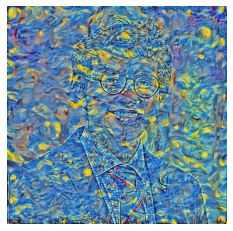

Saved checkpoint of model and image
Epoch 420:
Content Loss: 229.7895
Style Loss: 33.5691
Total Loss: 263.3586



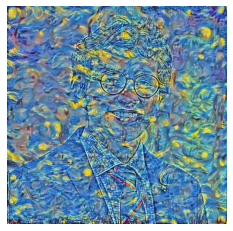

Saved checkpoint of model and image
Epoch 430:
Content Loss: 228.7107
Style Loss: 33.0577
Total Loss: 261.7684



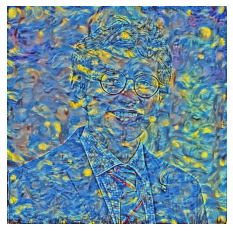

Saved checkpoint of model and image
Epoch 440:
Content Loss: 227.7008
Style Loss: 32.5857
Total Loss: 260.2865



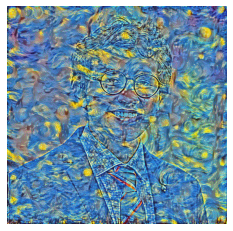

Saved checkpoint of model and image
Epoch 450:
Content Loss: 226.7462
Style Loss: 32.1684
Total Loss: 258.9146



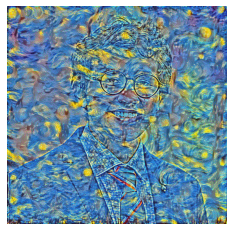

Saved checkpoint of model and image
Epoch 460:
Content Loss: 225.7774
Style Loss: 31.7816
Total Loss: 257.5591



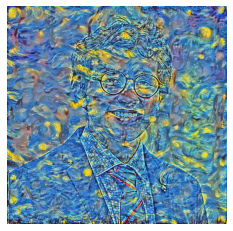

Saved checkpoint of model and image
Epoch 470:
Content Loss: 224.7301
Style Loss: 31.3684
Total Loss: 256.0985



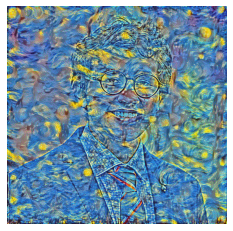

Saved checkpoint of model and image
Epoch 480:
Content Loss: 223.7375
Style Loss: 31.3496
Total Loss: 255.0871



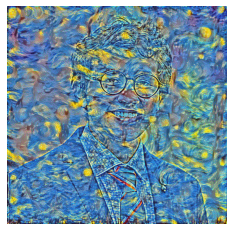

Saved checkpoint of model and image
Epoch 490:
Content Loss: 223.0591
Style Loss: 30.7678
Total Loss: 253.8269



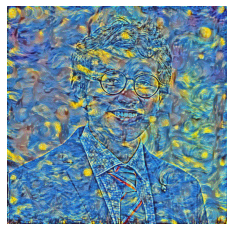

Saved checkpoint of model and image
Epoch 500:
Content Loss: 221.7996
Style Loss: 32.2239
Total Loss: 254.0235



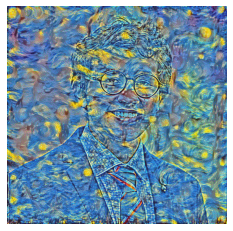

Epoch 510:
Content Loss: 221.6430
Style Loss: 30.9238
Total Loss: 252.5668



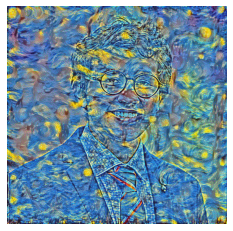

Epoch 520:
Content Loss: 220.6138
Style Loss: 29.6616
Total Loss: 250.2754



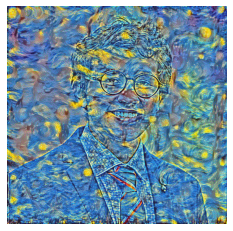

Saved checkpoint of model and image
Epoch 530:
Content Loss: 220.0050
Style Loss: 29.9508
Total Loss: 249.9558



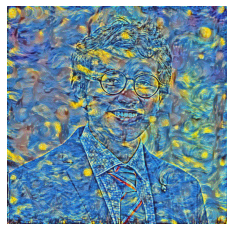

Saved checkpoint of model and image
Epoch 540:
Content Loss: 219.0258
Style Loss: 29.0306
Total Loss: 248.0564



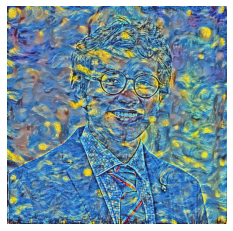

Saved checkpoint of model and image
Epoch 550:
Content Loss: 218.6844
Style Loss: 30.6036
Total Loss: 249.2880



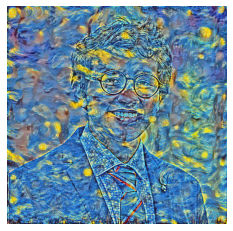

Epoch 560:
Content Loss: 217.6704
Style Loss: 28.6429
Total Loss: 246.3133



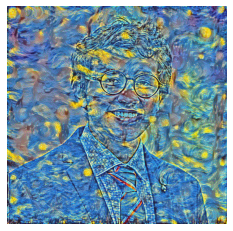

Saved checkpoint of model and image
Epoch 570:
Content Loss: 217.0768
Style Loss: 28.5343
Total Loss: 245.6111



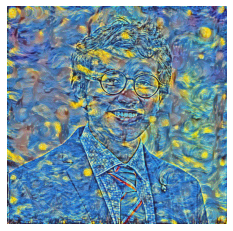

Saved checkpoint of model and image
Epoch 580:
Content Loss: 215.7253
Style Loss: 33.1569
Total Loss: 248.8822



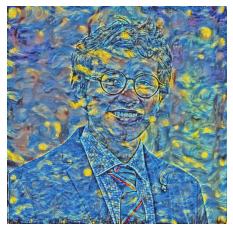

Epoch 590:
Content Loss: 216.9744
Style Loss: 32.5095
Total Loss: 249.4839



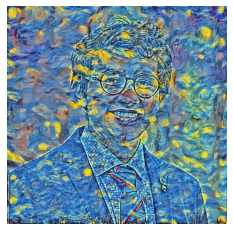

Epoch 600:
Content Loss: 216.0204
Style Loss: 28.2670
Total Loss: 244.2874



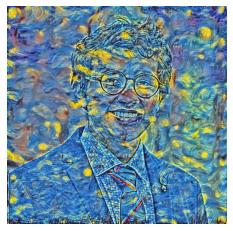

Saved checkpoint of model and image
Epoch 610:
Content Loss: 214.9444
Style Loss: 27.5659
Total Loss: 242.5103



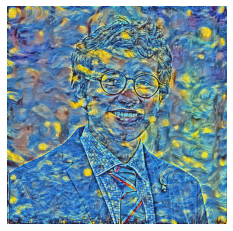

Saved checkpoint of model and image
Epoch 620:
Content Loss: 214.7091
Style Loss: 37.3708
Total Loss: 252.0799



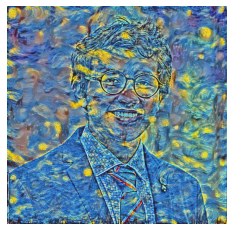

Epoch 630:
Content Loss: 216.7252
Style Loss: 42.7507
Total Loss: 259.4759



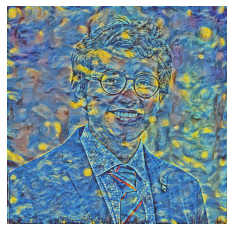

Epoch 640:
Content Loss: 216.4588
Style Loss: 31.6997
Total Loss: 248.1585



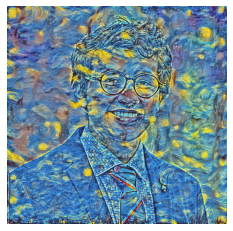

Epoch 650:
Content Loss: 214.7312
Style Loss: 29.9811
Total Loss: 244.7123



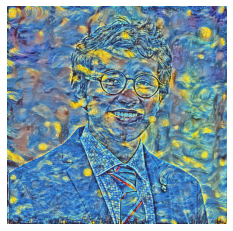

Epoch 660:
Content Loss: 213.0955
Style Loss: 27.0274
Total Loss: 240.1229



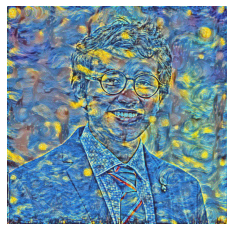

Saved checkpoint of model and image
Epoch 670:
Content Loss: 215.6492
Style Loss: 52.6138
Total Loss: 268.2630



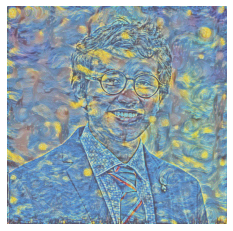

Epoch 680:
Content Loss: 216.5510
Style Loss: 31.1320
Total Loss: 247.6831



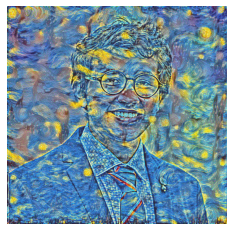

Epoch 690:
Content Loss: 214.5934
Style Loss: 31.9392
Total Loss: 246.5327



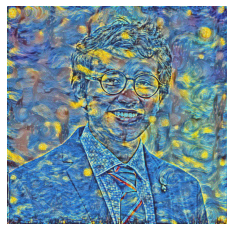

Epoch 700:
Content Loss: 215.8419
Style Loss: 34.9772
Total Loss: 250.8192



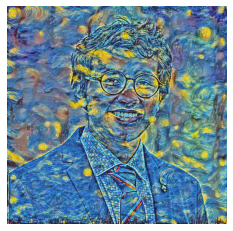

Epoch 710:
Content Loss: 213.9444
Style Loss: 29.6151
Total Loss: 243.5594



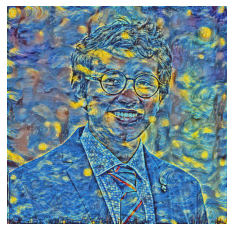

Epoch 720:
Content Loss: 210.9577
Style Loss: 59.1715
Total Loss: 270.1292



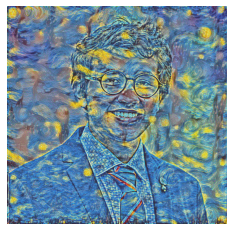

Epoch 730:
Content Loss: 212.2012
Style Loss: 31.4653
Total Loss: 243.6665



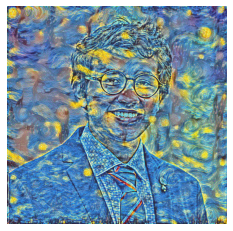

Epoch 740:
Content Loss: 211.2656
Style Loss: 27.0942
Total Loss: 238.3598



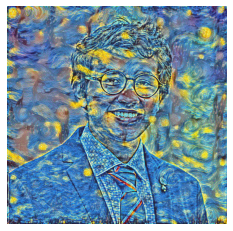

Epoch 750:
Content Loss: 211.5863
Style Loss: 55.9946
Total Loss: 267.5809



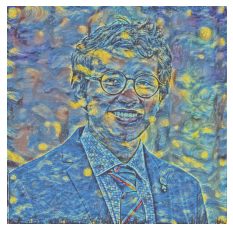

Epoch 760:
Content Loss: 213.3747
Style Loss: 31.0237
Total Loss: 244.3984



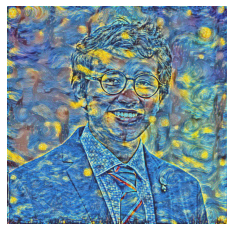

Epoch 770:
Content Loss: 211.5389
Style Loss: 27.0476
Total Loss: 238.5865



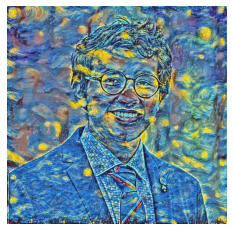

Epoch 780:
Content Loss: 210.4055
Style Loss: 37.2222
Total Loss: 247.6277



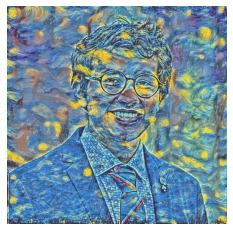

Epoch 790:
Content Loss: 208.4507
Style Loss: 59.3333
Total Loss: 267.7839



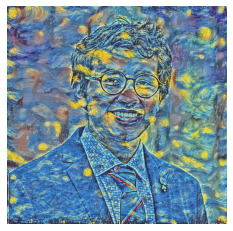

Epoch 800:
Content Loss: 209.9173
Style Loss: 29.1233
Total Loss: 239.0406



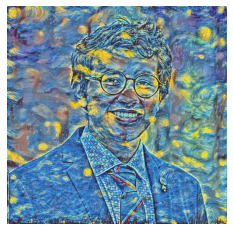

Epoch 810:
Content Loss: 208.8992
Style Loss: 26.7121
Total Loss: 235.6113



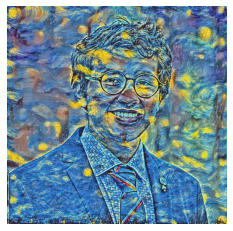

Epoch 820:
Content Loss: 206.5036
Style Loss: 40.1646
Total Loss: 246.6682



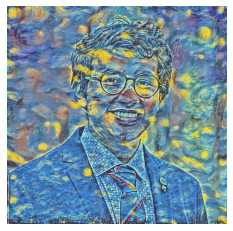

Epoch 830:
Content Loss: 209.0941
Style Loss: 48.3229
Total Loss: 257.4170



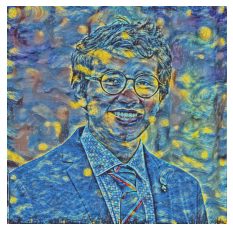

Epoch 840:
Content Loss: 208.6615
Style Loss: 49.2442
Total Loss: 257.9057



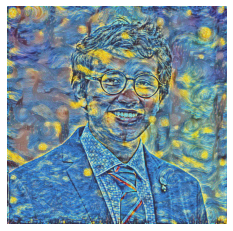

Epoch 850:
Content Loss: 210.0380
Style Loss: 36.4134
Total Loss: 246.4515



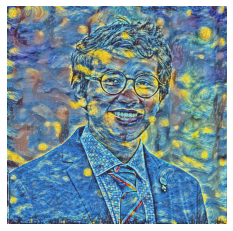

Epoch 860:
Content Loss: 215.5082
Style Loss: 73.8042
Total Loss: 289.3124



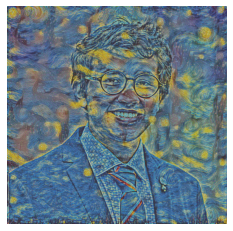

Epoch 870:
Content Loss: 227.1361
Style Loss: 75.2228
Total Loss: 302.3589



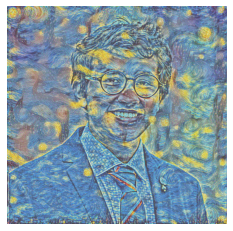

Epoch 880:
Content Loss: 239.9728
Style Loss: 173.0440
Total Loss: 413.0168



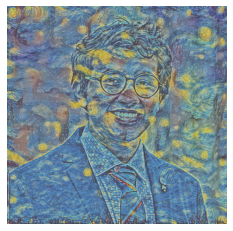

Epoch 890:
Content Loss: 252.5510
Style Loss: 452.0906
Total Loss: 704.6416



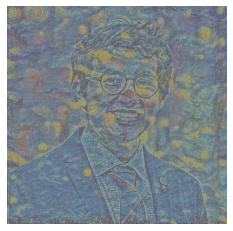

Epoch 900:
Content Loss: 259.0725
Style Loss: 154.6573
Total Loss: 413.7298



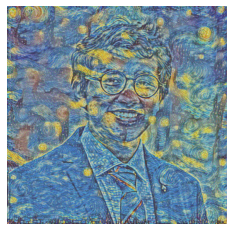

Epoch 910:
Content Loss: 266.3639
Style Loss: 614.3154
Total Loss: 880.6793



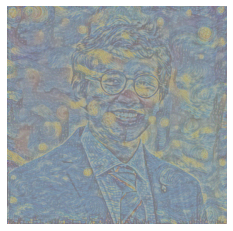

Epoch 920:
Content Loss: 270.8501
Style Loss: 879.3499
Total Loss: 1150.2000



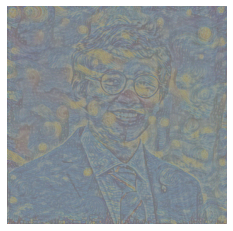

Epoch 930:
Content Loss: 284.7614
Style Loss: 522.7092
Total Loss: 807.4707



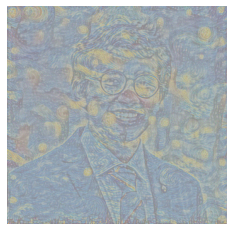

Epoch 940:
Content Loss: 295.0395
Style Loss: 358.0937
Total Loss: 653.1332



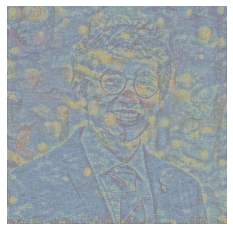

Epoch 950:
Content Loss: 302.9555
Style Loss: 388.7213
Total Loss: 691.6768



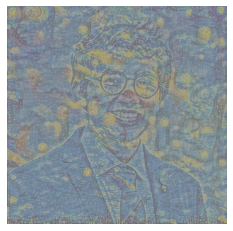

Epoch 960:
Content Loss: 301.4498
Style Loss: 366.8709
Total Loss: 668.3208



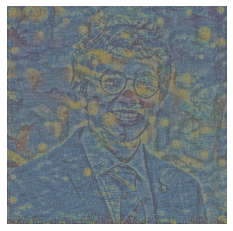

Epoch 970:
Content Loss: 292.2949
Style Loss: 300.3756
Total Loss: 592.6705



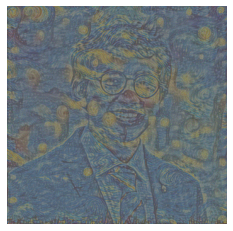

Epoch 980:
Content Loss: 283.3257
Style Loss: 264.3623
Total Loss: 547.6880



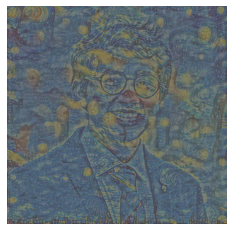

Epoch 990:
Content Loss: 278.4627
Style Loss: 302.0336
Total Loss: 580.4963



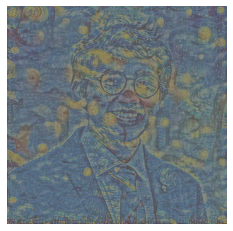

In [104]:
train_st(**parameters)

In [53]:
def stylize(image_size, content, model):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # get content transform
    content = content_transform(content, image_size)

    with torch.no_grad():
        # take the architecture of the model from vgg
        style_model = torchvision.models.vgg16(pretrained=False).requires_grad_(False).to(device)
        # load the model from saved pth file
        state_dict = torch.load(model, map_location=device)
        

        
        # remove saved deprecated running_* keys in InstanceNorm from the checkpoint
        for k in list(state_dict.keys()):
            if re.search(r'in\d+\.running_(mean|var)$', k):
                del state_dict[k]
        style_model.to(device)
        style_model.eval()
        # if args.export_onnx:
        #     assert args.export_onnx.endswith(".onnx"), "Export model file should end with .onnx"
        #     output = torch.onnx._export(
        #         style_model, content_image, args.export_onnx, opset_version=11,
        #     ).cpu()            
        # else:
        output = style_model(content).cpu()
        # display the image
        plt.axis("off")
        plt.imshow(detransform_content(output.data.cpu(), image_size))
        plt.show()
    return output


In [54]:
model = '{}_model_best.pth'.format(style_name)
stylize(192, content_image, model)

RuntimeError: ignored

In [24]:
style_name

'van_gogh'

In [42]:
model = '{}_model_330.pth'.format(style_name)
# load model from saved pth file
style_model = torchvision.models.vgg16(pretrained=False).requires_grad_(False).to(device)
state_dict = torch.load(model)
style_model.eval()

style_model.load_state_dict(state_dict)
# RuntimeError: PytorchStreamReader failed reading zip archive: failed finding central directory 
# got this error. How to fix it?


FileNotFoundError: ignored